In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
%matplotlib inline

In [3]:
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 100000)


# 1. Get Close price for each Stock Index and put them together into a Dataframe

In [4]:
#Change the dataset index to datetime
#Calculate their daily returns in % change
#Append each pct_change column to a list 
#Transform the list into a dataframe where each column is an individual index % change
# Load in SnP, DJI, NDX and N225 data
# Apparently dataset left out weekend dates, and put NA on trading holidays (such as christmas etc)

datasets_original_test = ['./data/^GSPC.csv', './data/^DJI.csv', './data/^NDX.csv', \
                          './data/^N225.csv','./data/^STI.csv','./data/^HSI.csv',\
                          './data/^BSESN.csv','./data/^KLCI.csv','./data/^SSEC.csv',\
                          './data/^UKX.csv','./data/^JKSE.csv']
dataset_names_test = ['S&P 500', 'Dow Jones', 'Nasdaq', 'Nikkei','STI','Hang Seng',\
                     'Bombay','Kuala Lumpur CI', 'ShangHai','FTSE100','Jakarta']
datasets_test = []
for d in datasets_original_test:
    data_original = pd.read_csv(d, index_col = 'Date')
    data_original.index = pd.to_datetime(data_original.index)#, format='%Y/%m/%d')
    data_ch = data_original['Close'].pct_change() #generate a column with timeseries dates and a column with percent change on closing price
    datasets_test.append(data_ch) 
df_returns = pd.concat(datasets_test, axis=1, join_axes=[datasets_test[0].index])
df_returns.columns = dataset_names_test
df_returns.head() # NA represents the dates where there are no data (SnP started since 1950s but the other index only exist later)

,S&P 500,Dow Jones,Nasdaq,Nikkei,STI,Hang Seng,Bombay,Kuala Lumpur CI,ShangHai,FTSE100,Jakarta
Date,,,,,,,,,,,
1950-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1950-01-04,0.011405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1950-01-05,0.004748,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1950-01-06,0.002953,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1950-01-09,0.005889,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 1a. Get Close price for each Stock Index, standardized them and put them together into a Dataframe for plotting 

In [24]:
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()

In [38]:
# Get just raw close price for each index and plot scatter plots

datasets_original_test = ['./data/^GSPC.csv', './data/^DJI.csv', './data/^NDX.csv', \
                          './data/^N225.csv','./data/^STI.csv','./data/^HSI.csv',\
                          './data/^BSESN.csv','./data/^KLCI.csv','./data/^SSEC.csv',\
                          './data/^UKX.csv','./data/^JKSE.csv']
dataset_names_test = ['S&P 500', 'Dow Jones', 'Nasdaq', 'Nikkei','STI','Hang Seng',\
                     'Bombay','Kuala Lumpur CI', 'ShangHai','FTSE100','Jakarta']
datasets_test = []
for d in datasets_original_test:
    data_original = pd.read_csv(d, index_col = 'Date')
    data_original.index = pd.to_datetime(data_original.index)#, format='%Y/%m/%d')
    data_ch = scaler.fit_transform(data_original[['Close']].values)
    data_ch = data_original['Close']
    #data_ch = pd.DataFrame(data_ch)
    #data_log = np.log(data_original['Close'].values) # log close price
    #data_log = pd.DataFrame(data_log)
    datasets_test.append(data_ch) 
df_returns = pd.concat(datasets_test, axis=1, join_axes=[datasets_test[0].index])
df_returns.columns = dataset_names_test
df_returns.head()

,S&P 500,Dow Jones,Nasdaq,Nikkei,STI,Hang Seng,Bombay,Kuala Lumpur CI,ShangHai,FTSE100,Jakarta
Date,,,,,,,,,,,
1950-01-03,16.66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1950-01-04,16.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1950-01-05,16.93,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1950-01-06,16.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1950-01-09,17.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


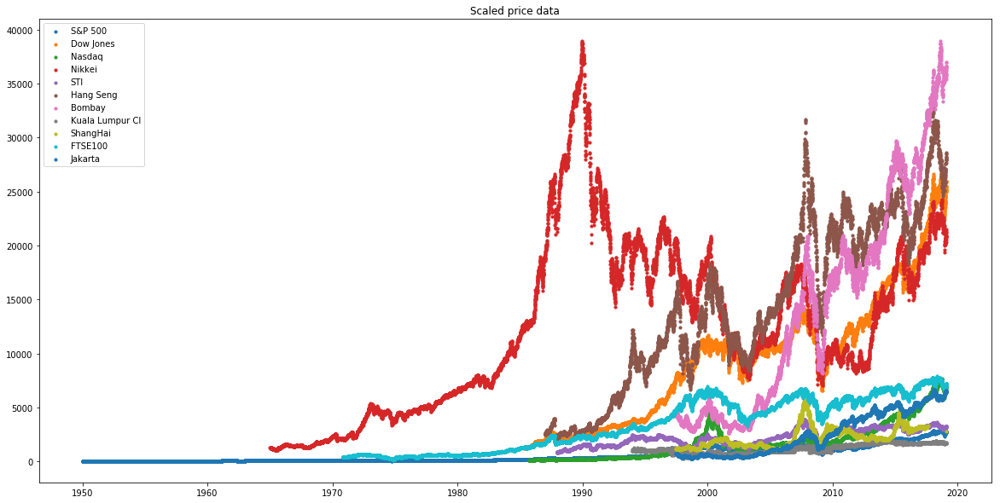

In [39]:
# plot scatter plot for ALL the index price
fig = plt.figure(figsize=(20,10))
ax1 = fig.add_subplot(111)

for stock in dataset_names_test:
    ax1.scatter(df_returns.index,df_returns[stock],s=10,label=stock)

plt.title('Scaled price data')
plt.legend(loc='upper left')
plt.show()

In [5]:
df_returns.info()

# a lot of null values due to the different starting points for the historical data 
# of each index

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17396 entries, 1950-01-03 to 2019-02-21
Data columns (total 11 columns):
S&P 500            17395 non-null float64
Dow Jones          8585 non-null float64
Nasdaq             8416 non-null float64
Nikkei             13465 non-null float64
STI                7593 non-null float64
Hang Seng          7944 non-null float64
Bombay             5274 non-null float64
Kuala Lumpur CI    5352 non-null float64
ShangHai           4882 non-null float64
FTSE100            11979 non-null float64
Jakarta            5294 non-null float64
dtypes: float64(11)
memory usage: 1.6 MB


In [6]:
data_original.head()

# how an original dataset downloaded from the web looks like

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1997-07-01,725.028992,732.515991,724.994995,731.619019,731.597290,0.0
1997-07-02,731.752991,734.018005,727.452026,730.155029,730.133362,0.0
1997-07-03,730.481995,735.492004,729.562988,735.492004,735.470154,0.0
1997-07-04,735.825012,736.596985,733.885986,736.596985,736.575134,0.0
1997-07-07,736.617981,739.833008,735.773987,738.005981,737.984070,0.0


Text(0.5, 1.0, 'Correlation of Close Price between Major stock indexes')

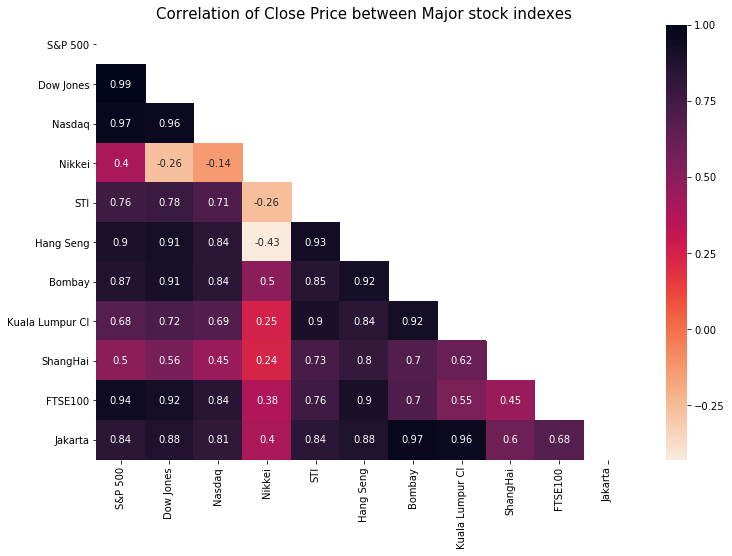

In [8]:
# Calculate and determine correlation between Closing Price

datasets_original_test = ['./data/^GSPC.csv', './data/^DJI.csv', './data/^NDX.csv', \
                          './data/^N225.csv','./data/^STI.csv','./data/^HSI.csv',\
                          './data/^BSESN.csv','./data/^KLCI.csv','./data/^SSEC.csv',\
                          './data/^UKX.csv','./data/^JKSE.csv']
dataset_names_test = ['S&P 500', 'Dow Jones', 'Nasdaq', 'Nikkei','STI','Hang Seng',\
                     'Bombay','Kuala Lumpur CI', 'ShangHai','FTSE100','Jakarta']
datasets_test = []
for d in datasets_original_test:
    data_original = pd.read_csv(d, index_col = 'Date')
    data_original.index = pd.to_datetime(data_original.index)#, format='%Y/%m/%d')
    data_close = data_original['Close']#/data_original['Close'][-1] #generate a column with timeseries dates and a column with percent change on closing price
    datasets_test.append(data_close) 
df_close_norm = pd.concat(datasets_test, axis=1, join_axes=[datasets_test[0].index])
df_close_norm.columns = dataset_names_test
df_close_norm.head() # NA represents the dates where there are no data (SnP started since 1950s but the other index only exist later)

fig = plt.subplots(figsize=(12,8))

corr1 = df_close_norm.corr()
mask = np.zeros_like(corr1, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
ax = sns.heatmap(corr1, annot=True, cmap='rocket_r',mask=mask)
plt.title('Correlation of Close Price between Major stock indexes',fontdict={'fontsize':15})

Correlations of daily returns between datasets (non-correlated datasets):


Text(0.5, 1.0, 'Correlation of Returns between major stock indexes')

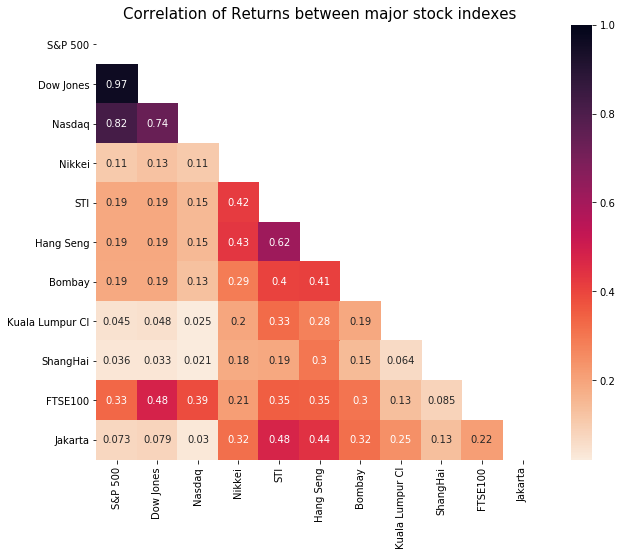

In [9]:
## Plot heatmap to see correlation between the % price change/ returns
plt.figure(figsize=(10,8))
corr = df_returns.corr()
print('Correlations of daily returns between datasets (non-correlated datasets):')
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
ax = sns.heatmap(corr, annot=True, cmap='rocket_r',mask=mask)
plt.title('Correlation of Returns between major stock indexes',fontdict={'fontsize': 15})

## From the heatmap, it can be observed that the US market returns are correlated with each other (expected). As the 3 US markets are the largest in the world, use them as a reference to look at the correlation with other index. 

- Surprisingly, the stock prices for almost all the major indexes are highly correlated with each other, except Nikkei/Japan!. This could be explained by the consistent high uptrends OF all the markets except Japan.
- Other than the FTSE100 (UK, Europe) the other markets in the Asian region are not really correlated with the US.
- Out of the 3 US index, the training of the dataset will be done on the SnP500 due to its longest history and thus increase likelihood that there are more crash data for the model to train and identify

# Determine the correlation of commodity with US indexes
- Another approach is to use the price changes of commodity and other key economic data as predictors of a crash
- Commodity and other data used are Gold, Oil and the 10-year yield curve

In [ ]:

datasets_original_test = ['./data/^GSPC.csv', './data/^DJI.csv', './data/^NDX.csv', \
                          './data/^N225.csv','./data/^STI.csv','./data/^HSI.csv',\
                          './data/^BSESN.csv','./data/^KLCI.csv','./data/^SSEC.csv',\
                          './data/^UKX.csv','./data/^JKSE.csv']
dataset_names_test = ['S&P 500', 'Dow Jones', 'Nasdaq', 'Nikkei','STI','Hang Seng',\
                     'Bombay','Kuala Lumpur CI', 'ShangHai','FTSE100','Jakarta']
datasets_test = []
for d in datasets_original_test:
    data_original = pd.read_csv(d, index_col = 'Date')
    data_original.index = pd.to_datetime(data_original.index)#, format='%Y/%m/%d')
    data_ch = data_original['Close'].pct_change() #generate a column with timeseries dates and a column with percent change on closing price
    datasets_test.append(data_ch) 
df_returns = pd.concat(datasets_test, axis=1, join_axes=[datasets_test[0].index])
df_returns.columns = dataset_names_test
df_returns.head() # NA represents the dates where there are no data (SnP started since 1950s but the other index only exist later)

# 1. Feature Engineer % change, volatility in 10 day window

In [27]:
datasets_original = ['./data/^GSPC.csv', './data/^DJI.csv', './data/^NDX.csv', \
                          './data/^N225.csv','./data/^STI.csv','./data/^HSI.csv',\
                          './data/^BSESN.csv','./data/^KLCI.csv','./data/^SSEC.csv',\
                          './data/^UKX.csv','./data/^JKSE.csv']
dataset_names_test = ['S&P 500', 'Dow Jones', 'Nasdaq', 'Nikkei','STI','Hang Seng',\
                     'Bombay','Kuala Lumpur CI', 'ShangHai','FTSE100','Jakarta']

for i, d in zip(dataset_names_test,datasets_original):
    data_original = pd.read_csv(d, index_col = 'Date')
    data_original.index = pd.to_datetime(data_original.index) #, format='%Y/%m/%d')
    data_norm = data_original['Close']/ data_original['Close'][-1]
    data_ch = data_original['Close'].pct_change()
    window = 10 # calculate based on a 10 day period
    #data_vol = data_original['Close'].pct_change().rolling(window).std() #data volatility (range of high and low)
    data_vol = (data_original['High'] - data_original['Low']).pct_change().rolling(window).std()
    data = pd.concat([data_original['Close'], data_norm, data_ch, data_vol], axis=1).dropna()
    data.columns = ['price', 'price_norm', '%change', 'volatility']
    data.to_csv('./feature_engineer/{}_feature_engineered.csv'.format(i)) #saves the dataframe as a csv file


In [51]:
## Try out on 1 stock index first

datasets_original = ['./data/^STI.csv']
dataset_names = ['STI']

for d in datasets_original:
    data_original = pd.read_csv(d, index_col = 'Date')
    data_original.index = pd.to_datetime(data_original.index, format='%Y/%m/%d')
    data_norm = data_original['Close'] / data_original['Close'][-1] #?? what is this?
    data_ch = data_original['Close'].pct_change()
    window = 10
    #data_vol = data_original['Close'].pct_change().rolling(window).std() #data volatility (range of high and low)
    data_vol = (data_original['High'] - data_original['Low']).pct_change().rolling(window).std()
    data = pd.concat([data_original['Close'], data_norm, data_ch, data_vol], axis=1).dropna()
    data.columns = ['price', 'price_norm', '%change', 'volatility']

print(data.shape)
data.head()

(6683, 4)


,price,price_norm,%change,volatility
Date,,,,
1992-06-25,1501.4,0.457970,0.008531,0.862081
1992-06-26,1492.7,0.455316,-0.005795,0.796028
1992-06-29,1481.7,0.451961,-0.007369,0.777328
1992-06-30,1481.1,0.451778,-0.000405,0.657021
1992-07-01,1491.2,0.454859,0.006819,0.632172


# 2. Create a dataframe on drawdowns amount and duration/date df_d and dataframe of crashes (drawdowns > 99.5th percentile of drawdowns) df_c

In [4]:
# Create names for the created dataframes from step 1
    
datasets_original = ['./data/^GSPC.csv', './data/^DJI.csv', './data/^NDX.csv', \
                          './data/^N225.csv','./data/^STI.csv','./data/^HSI.csv',\
                          './data/^BSESN.csv','./data/^KLCI.csv','./data/^SSEC.csv',\
                          './data/^UKX.csv','./data/^JKSE.csv']

dataset_names_test = ['S&P 500', 'Dow Jones', 'Nasdaq', 'Nikkei','STI','Hang Seng',\
                     'Bombay','Kuala Lumpur CI', 'ShangHai','FTSE100','Jakarta']

feature_engineer_names  = ['./feature_engineer/' + name + '_feature_engineered.csv' for name in dataset_names_test]

feature_engineer_names

['./feature_engineer/S&P 500_feature_engineered.csv',
 './feature_engineer/Dow Jones_feature_engineered.csv',
 './feature_engineer/Nasdaq_feature_engineered.csv',
 './feature_engineer/Nikkei_feature_engineered.csv',
 './feature_engineer/STI_feature_engineered.csv',
 './feature_engineer/Hang Seng_feature_engineered.csv',
 './feature_engineer/Bombay_feature_engineered.csv',
 './feature_engineer/Kuala Lumpur CI_feature_engineered.csv',
 './feature_engineer/ShangHai_feature_engineered.csv',
 './feature_engineer/FTSE100_feature_engineered.csv',
 './feature_engineer/Jakarta_feature_engineered.csv']

In [48]:
# The code below creates a dataframe with crashes identified as below threshold, df_c
# Before df_c is created, df_d is created which consist of the drawdowns

dataset_names_test = ['S&P 500', 'Dow Jones', 'Nasdaq', 'Nikkei','STI','Hang Seng',\
                     'Bombay','Kuala Lumpur CI', 'ShangHai','FTSE100','Jakarta']

# order of naming in feature_engineer_names is the same as dataset_names_test

crash_thresholds = [] # create an empty list to save the crash thresholds for each stock fund based on 99.5% percentile theory
for i, d in zip(dataset_names_test,feature_engineer_names):
    df = pd.read_csv(d, index_col = 'Date')
    df.index = pd.to_datetime(df.index, format='%Y/%m/%d')
#df = data
    pmin_pmax = (df['price'].diff(-1) > 0).astype(int).diff()
    pmax = pmin_pmax[pmin_pmax == 1]
    pmin = pmin_pmax[pmin_pmax == -1]
    # make sure drawdowns start with pmax, end with pmin:
    if pmin.index[0] < pmax.index[0]:
        pmin = pmin.drop(pmin.index[0])
    if pmin.index[-1] < pmax.index[-1]:
        pmax = pmax.drop(pmax.index[-1])
    D = (np.array(df['price'][pmin.index]) - np.array(df['price']\
         [pmax.index]))/ np.array(df['price'][pmax.index])
    d = {'Date':pmax.index, 'drawdown':D, 'd_start': pmax.index,\
         'd_end': pmin.index}    
    df_d = pd.DataFrame(d).set_index('Date')
    df_d.index = pd.to_datetime(df_d.index, format='%Y/%m/%d')
    df_d = df_d.reindex(df.index).fillna(0)
    df_d = df_d.sort_values(by='drawdown')
    df_d['rank'] = list(range(1,df_d.shape[0]+1))
    
    #df_d is a dataframe of Date, drawdown %, d_start, d_end as well as rank of drawdown (largest to smallest)
    ct = df_d['drawdown'].iloc[round(df_d.shape[0] * .005)] #crash threshold, ct = 0.005 x length of df_d when drawdowns are ranked 
    df_d = df_d.sort_values(by='Date')
    df_c = df_d[df_d['drawdown'] < ct] #create a new df call df_c by filtering drawdowns < crash threshold
    df_c.columns = ['drawdown', 'crash_st', 'crash_end', 'rank']
    crash_thresholds.append(ct)
    df_c.to_csv('./crash_threshold/{}_crash.csv'.format(i),date_format='%Y/%m/%d') #saves the dataframe as a csv file')
    display(df_c)

,drawdown,d_start,d_end,rank
Date,,,,
1987-10-13,-0.285133,1987-10-13 00:00:00,1987-10-19 00:00:00,1
2008-09-30,-0.229037,2008-09-30 00:00:00,2008-10-10 00:00:00,2
1974-08-07,-0.153176,1974-08-07 00:00:00,1974-08-29 00:00:00,3
1962-05-15,-0.136724,1962-05-15 00:00:00,1962-05-28 00:00:00,4
2008-11-18,-0.124174,2008-11-18 00:00:00,2008-11-20 00:00:00,5
1998-08-25,-0.124052,1998-08-25 00:00:00,1998-08-31 00:00:00,6
2002-07-17,-0.119575,2002-07-17 00:00:00,2002-07-23 00:00:00,7
1987-10-21,-0.118856,1987-10-21 00:00:00,1987-10-26 00:00:00,8
2001-09-10,-0.116005,2001-09-10 00:00:00,2001-09-21 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1962-05-03,-0.058320,1962-05-03 00:00:00,1962-05-11 00:00:00,71
1962-05-15,-0.136724,1962-05-15 00:00:00,1962-05-28 00:00:00,4
1962-06-08,-0.070488,1962-06-08 00:00:00,1962-06-14 00:00:00,42
1962-06-15,-0.063875,1962-06-15 00:00:00,1962-06-26 00:00:00,57
1962-10-15,-0.066003,1962-10-15 00:00:00,1962-10-23 00:00:00,50
1966-04-21,-0.066003,1966-04-21 00:00:00,1966-05-09 00:00:00,51
1966-08-12,-0.060839,1966-08-12 00:00:00,1966-08-23 00:00:00,65
1969-07-17,-0.065581,1969-07-17 00:00:00,1969-07-29 00:00:00,52
1970-04-20,-0.064779,1970-04-20 00:00:00,1970-04-28 00:00:00,56


,drawdown,d_start,d_end,rank
Date,,,,
1987-10-13,-0.306767,1987-10-13 00:00:00,1987-10-19 00:00:00,1
2008-09-30,-0.221136,2008-09-30 00:00:00,2008-10-10 00:00:00,2
2001-09-05,-0.179150,2001-09-05 00:00:00,2001-09-21 00:00:00,3
1998-08-25,-0.123634,1998-08-25 00:00:00,1998-08-31 00:00:00,4
1997-10-21,-0.111558,1997-10-21 00:00:00,1997-10-27 00:00:00,5
2015-08-17,-0.107080,2015-08-17 00:00:00,2015-08-25 00:00:00,6
2008-11-18,-0.103559,2008-11-18 00:00:00,2008-11-20 00:00:00,7
2002-07-17,-0.098349,2002-07-17 00:00:00,2002-07-23 00:00:00,8
2002-07-05,-0.096635,2002-07-05 00:00:00,2002-07-16 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1986-09-04,-0.083862,1986-09-04 00:00:00,1986-09-12 00:00:00,15
1987-10-13,-0.306767,1987-10-13 00:00:00,1987-10-19 00:00:00,1
1987-10-23,-0.080394,1987-10-23 00:00:00,1987-10-26 00:00:00,17
1987-11-24,-0.066197,1987-11-24 00:00:00,1987-11-30 00:00:00,31
1988-01-07,-0.068512,1988-01-07 00:00:00,1988-01-08 00:00:00,28
1989-10-09,-0.079583,1989-10-09 00:00:00,1989-10-13 00:00:00,18
1990-07-30,-0.070849,1990-07-30 00:00:00,1990-08-07 00:00:00,23
1990-08-20,-0.065132,1990-08-20 00:00:00,1990-08-23 00:00:00,32
1990-10-08,-0.062866,1990-10-08 00:00:00,1990-10-11 00:00:00,36


,drawdown,d_start,d_end,rank
Date,,,,
1987-10-13,-0.284600,1987-10-13 00:00:00,1987-10-20 00:00:00,1
2000-04-07,-0.252490,2000-04-07 00:00:00,2000-04-14 00:00:00,2
1987-10-21,-0.191176,1987-10-21 00:00:00,1987-10-26 00:00:00,3
1998-08-25,-0.178637,1998-08-25 00:00:00,1998-08-31 00:00:00,4
2001-09-10,-0.174631,2001-09-10 00:00:00,2001-09-21 00:00:00,5
2008-09-30,-0.165963,2008-09-30 00:00:00,2008-10-07 00:00:00,6
2001-03-07,-0.158093,2001-03-07 00:00:00,2001-03-12 00:00:00,7
2000-11-03,-0.146088,2000-11-03 00:00:00,2000-11-13 00:00:00,8
1990-08-15,-0.144725,1990-08-15 00:00:00,1990-08-23 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1986-09-04,-0.108689,1986-09-04 00:00:00,1986-09-15 00:00:00,29
1987-10-13,-0.284600,1987-10-13 00:00:00,1987-10-20 00:00:00,1
1987-10-21,-0.191176,1987-10-21 00:00:00,1987-10-26 00:00:00,3
1990-07-25,-0.119380,1990-07-25 00:00:00,1990-08-06 00:00:00,20
1990-08-15,-0.144725,1990-08-15 00:00:00,1990-08-23 00:00:00,9
1997-10-21,-0.119238,1997-10-21 00:00:00,1997-10-27 00:00:00,21
1998-08-25,-0.178637,1998-08-25 00:00:00,1998-08-31 00:00:00,4
1998-10-02,-0.115603,1998-10-02 00:00:00,1998-10-08 00:00:00,23
2000-01-03,-0.118648,2000-01-03 00:00:00,2000-01-06 00:00:00,22


,drawdown,d_start,d_end,rank
Date,,,,
2008-10-01,-0.271970,2008-10-01 00:00:00,2008-10-10 00:00:00,1
2008-10-21,-0.230313,2008-10-21 00:00:00,2008-10-27 00:00:00,2
2011-03-09,-0.187388,2011-03-09 00:00:00,2011-03-15 00:00:00,3
1990-08-15,-0.155609,1990-08-15 00:00:00,1990-08-23 00:00:00,4
1990-09-21,-0.149550,1990-09-21 00:00:00,1990-10-01 00:00:00,5
2015-08-17,-0.136446,2015-08-17 00:00:00,2015-08-25 00:00:00,6
2016-02-08,-0.120657,2016-02-08 00:00:00,2016-02-12 00:00:00,7
1990-03-26,-0.120552,1990-03-26 00:00:00,1990-04-02 00:00:00,8
2000-12-13,-0.115071,2000-12-13 00:00:00,2000-12-21 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1990-03-15,-0.086567,1990-03-15 00:00:00,1990-03-22 00:00:00,30
1990-03-26,-0.120552,1990-03-26 00:00:00,1990-04-02 00:00:00,8
1990-07-31,-0.108990,1990-07-31 00:00:00,1990-08-07 00:00:00,13
1990-08-15,-0.155609,1990-08-15 00:00:00,1990-08-23 00:00:00,4
1990-08-31,-0.083395,1990-08-31 00:00:00,1990-09-06 00:00:00,37
1990-09-21,-0.149550,1990-09-21 00:00:00,1990-10-01 00:00:00,5
1992-04-03,-0.105689,1992-04-03 00:00:00,1992-04-09 00:00:00,14
1995-01-11,-0.090185,1995-01-11 00:00:00,1995-01-23 00:00:00,26
1997-01-06,-0.110169,1997-01-06 00:00:00,1997-01-10 00:00:00,11


,drawdown,d_start,d_end,rank
Date,,,,
1997-12-31,-0.298274,1997-12-31 00:00:00,1998-01-12 00:00:00,1
2008-10-20,-0.174782,2008-10-20 00:00:00,2008-10-24 00:00:00,2
2001-09-11,-0.154752,2001-09-11 00:00:00,2001-09-18 00:00:00,3
1998-04-29,-0.133366,1998-04-29 00:00:00,1998-05-14 00:00:00,4
2011-08-01,-0.130331,2011-08-01 00:00:00,2011-08-11 00:00:00,5
1998-06-03,-0.124602,1998-06-03 00:00:00,1998-06-10 00:00:00,6
1998-08-26,-0.120862,1998-08-26 00:00:00,1998-09-01 00:00:00,7
2000-09-04,-0.117380,2000-09-04 00:00:00,2000-09-22 00:00:00,8
2008-10-14,-0.117370,2008-10-14 00:00:00,2008-10-17 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1994-01-10,-0.094663,1994-01-10 00:00:00,1994-01-13 00:00:00,16
1994-03-04,-0.094414,1994-03-04 00:00:00,1994-03-21 00:00:00,17
1995-01-16,-0.090396,1995-01-16 00:00:00,1995-01-23 00:00:00,20
1997-10-17,-0.114698,1997-10-17 00:00:00,1997-10-24 00:00:00,10
1997-10-27,-0.075869,1997-10-27 00:00:00,1997-10-28 00:00:00,32
1997-12-08,-0.109375,1997-12-08 00:00:00,1997-12-16 00:00:00,12
1997-12-31,-0.298274,1997-12-31 00:00:00,1998-01-12 00:00:00,1
1998-02-11,-0.086165,1998-02-11 00:00:00,1998-02-16 00:00:00,25
1998-04-29,-0.133366,1998-04-29 00:00:00,1998-05-14 00:00:00,4


,drawdown,d_start,d_end,rank
Date,,,,
2008-10-20,-0.281092,2008-10-20 00:00:00,2008-10-27 00:00:00,1
1997-12-30,-0.244914,1997-12-30 00:00:00,1998-01-12 00:00:00,2
1997-10-17,-0.233417,1997-10-17 00:00:00,1997-10-23 00:00:00,3
1997-10-24,-0.187037,1997-10-24 00:00:00,1997-10-28 00:00:00,4
1992-11-27,-0.168457,1992-11-27 00:00:00,1992-12-03 00:00:00,5
2008-10-02,-0.152620,2008-10-02 00:00:00,2008-10-08 00:00:00,6
2008-09-08,-0.152052,2008-09-08 00:00:00,2008-09-18 00:00:00,7
2011-08-01,-0.147051,2011-08-01 00:00:00,2011-08-09 00:00:00,8
1997-08-25,-0.139318,1997-08-25 00:00:00,1997-09-01 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1987-10-30,-0.110501,1987-10-30 00:00:00,1987-11-05 00:00:00,21
1987-11-27,-0.136326,1987-11-27 00:00:00,1987-12-07 00:00:00,11
1990-08-01,-0.106690,1990-08-01 00:00:00,1990-08-07 00:00:00,25
1990-08-16,-0.098021,1990-08-16 00:00:00,1990-08-23 00:00:00,34
1992-11-27,-0.168457,1992-11-27 00:00:00,1992-12-03 00:00:00,5
1993-03-09,-0.100399,1993-03-09 00:00:00,1993-03-15 00:00:00,31
1994-01-04,-0.098319,1994-01-04 00:00:00,1994-01-07 00:00:00,33
1994-01-10,-0.104725,1994-01-10 00:00:00,1994-01-13 00:00:00,28
1994-03-14,-0.131572,1994-03-14 00:00:00,1994-03-21 00:00:00,13


,drawdown,d_start,d_end,rank
Date,,,,
2008-10-21,-0.203478,2008-10-21 00:00:00,2008-10-27 00:00:00,1
2008-11-10,-0.197904,2008-11-10 00:00:00,2008-11-20 00:00:00,2
2008-01-11,-0.196736,2008-01-11 00:00:00,2008-01-22 00:00:00,3
2008-10-01,-0.193619,2008-10-01 00:00:00,2008-10-10 00:00:00,4
2000-04-11,-0.185957,2000-04-11 00:00:00,2000-04-24 00:00:00,5
2001-09-04,-0.170386,2001-09-04 00:00:00,2001-09-17 00:00:00,6
2004-05-13,-0.165629,2004-05-13 00:00:00,2004-05-17 00:00:00,7
2000-07-12,-0.156305,2000-07-12 00:00:00,2000-07-24 00:00:00,8
2006-05-17,-0.142091,2006-05-17 00:00:00,2006-05-22 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1998-06-17,-0.106914,1998-06-17 00:00:00,1998-06-23 00:00:00,20
1998-07-16,-0.115685,1998-07-16 00:00:00,1998-07-27 00:00:00,13
1998-09-24,-0.107658,1998-09-24 00:00:00,1998-10-05 00:00:00,19
1999-10-25,-0.113220,1999-10-25 00:00:00,1999-11-01 00:00:00,14
2000-04-11,-0.185957,2000-04-11 00:00:00,2000-04-24 00:00:00,5
2000-05-09,-0.102949,2000-05-09 00:00:00,2000-05-12 00:00:00,22
2000-07-12,-0.156305,2000-07-12 00:00:00,2000-07-24 00:00:00,8
2000-09-12,-0.104813,2000-09-12 00:00:00,2000-09-19 00:00:00,21
2001-03-08,-0.127261,2001-03-08 00:00:00,2001-03-13 00:00:00,11


,drawdown,d_start,d_end,rank
Date,,,,
1997-11-11,-0.225086,1997-11-11 00:00:00,1997-11-20 00:00:00,1
1998-07-09,-0.214578,1998-07-09 00:00:00,1998-08-09 00:00:00,2
1997-08-20,-0.213486,1997-08-20 00:00:00,1997-04-09 00:00:00,3
1997-12-31,-0.196605,1997-12-31 00:00:00,1998-12-01 00:00:00,4
1998-08-26,-0.190422,1998-08-26 00:00:00,1998-01-09 00:00:00,5
2001-02-04,-0.149676,2001-02-04 00:00:00,2001-09-04 00:00:00,6
1997-10-12,-0.144651,1997-10-12 00:00:00,1997-12-16 00:00:00,7
1998-09-06,-0.138043,1998-09-06 00:00:00,1998-06-16 00:00:00,8
1997-10-16,-0.136692,1997-10-16 00:00:00,1997-10-24 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1994-11-03,-0.089071,1994-11-03 00:00:00,1994-03-21 00:00:00,23
1994-11-30,-0.115839,1994-11-30 00:00:00,1994-12-12 00:00:00,15
1995-01-17,-0.092678,1995-01-17 00:00:00,1995-01-24 00:00:00,22
1997-07-29,-0.083879,1997-07-29 00:00:00,1997-05-08 00:00:00,26
1997-08-20,-0.213486,1997-08-20 00:00:00,1997-04-09 00:00:00,3
1997-10-12,-0.144651,1997-10-12 00:00:00,1997-12-16 00:00:00,7
1997-10-16,-0.136692,1997-10-16 00:00:00,1997-10-24 00:00:00,9
1997-11-11,-0.225086,1997-11-11 00:00:00,1997-11-20 00:00:00,1
1997-11-24,-0.077905,1997-11-24 00:00:00,1997-11-26 00:00:00,29


,drawdown,d_start,d_end,rank
Date,,,,
2015-08-19,-0.228465,2015-08-19 00:00:00,2015-08-26 00:00:00,1
2017-08-25,-0.174011,2017-08-25 00:00:00,2019-02-21 00:00:00,2
2008-06-02,-0.170638,2008-06-02 00:00:00,2008-06-13 00:00:00,3
2015-06-30,-0.138012,2015-06-30 00:00:00,2015-07-03 00:00:00,4
2015-06-24,-0.135842,2015-06-24 00:00:00,2015-06-29 00:00:00,5
2008-09-25,-0.129240,2008-09-25 00:00:00,2008-10-10 00:00:00,6
2008-10-20,-0.126978,2008-10-20 00:00:00,2008-10-27 00:00:00,7
1997-09-19,-0.120349,1997-09-19 00:00:00,1997-09-23 00:00:00,8
2008-01-18,-0.119827,2008-01-18 00:00:00,2008-01-22 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1997-09-19,-0.120349,1997-09-19 00:00:00,1997-09-23 00:00:00,8
1998-08-13,-0.111088,1998-08-13 00:00:00,1998-08-17 00:00:00,14
1999-06-29,-0.102586,1999-06-29 00:00:00,1999-07-01 00:00:00,17
2001-07-20,-0.118968,2001-07-20 00:00:00,2001-07-31 00:00:00,11
2001-10-12,-0.100901,2001-10-12 00:00:00,2001-10-22 00:00:00,20
2007-01-29,-0.112970,2007-01-29 00:00:00,2007-02-05 00:00:00,12
2007-05-31,-0.106883,2007-05-31 00:00:00,2007-06-04 00:00:00,15
2008-01-18,-0.119827,2008-01-18 00:00:00,2008-01-22 00:00:00,9
2008-02-19,-0.101143,2008-02-19 00:00:00,2008-02-25 00:00:00,18


,drawdown,d_start,d_end,rank
Date,,,,
1987-10-13,-0.233427,1987-10-13 00:00:00,1987-10-20 00:00:00,1
2008-10-07,-0.146173,2008-10-07 00:00:00,2008-10-10 00:00:00,2
2011-07-28,-0.136937,2011-07-28 00:00:00,2011-08-08 00:00:00,3
2002-07-05,-0.134565,2002-07-05 00:00:00,2002-07-15 00:00:00,4
1987-10-21,-0.133604,1987-10-21 00:00:00,1987-10-26 00:00:00,5
2015-08-10,-0.124306,2015-08-10 00:00:00,2015-08-24 00:00:00,6
2003-01-10,-0.124129,2003-01-10 00:00:00,2003-01-27 00:00:00,7
2008-10-14,-0.121255,2008-10-14 00:00:00,2008-10-16 00:00:00,8
2002-07-18,-0.121053,2002-07-18 00:00:00,2002-07-24 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1984-05-21,-0.081828,1984-05-21 00:00:00,1984-05-31 00:00:00,23
1984-07-04,-0.069743,1984-07-04 00:00:00,1984-07-12 00:00:00,30
1987-07-29,-0.065839,1987-07-29 00:00:00,1987-08-07 00:00:00,36
1987-10-13,-0.233427,1987-10-13 00:00:00,1987-10-20 00:00:00,1
1987-10-21,-0.133604,1987-10-21 00:00:00,1987-10-26 00:00:00,5
1987-10-30,-0.080981,1987-10-30 00:00:00,1987-11-04 00:00:00,24
1987-11-24,-0.065479,1987-11-24 00:00:00,1987-12-01 00:00:00,37
1990-08-15,-0.073371,1990-08-15 00:00:00,1990-08-23 00:00:00,28
1997-10-21,-0.090032,1997-10-21 00:00:00,1997-10-28 00:00:00,18


,drawdown,d_start,d_end,rank
Date,,,,
2008-10-10,-0.234405,2008-10-10 00:00:00,2008-10-28 00:00:00,1
2008-09-24,-0.229291,2008-09-24 00:00:00,2008-10-08 00:00:00,2
1998-09-10,-0.215225,1998-09-10 00:00:00,1998-09-21 00:00:00,3
1997-12-09,-0.202023,1997-12-09 00:00:00,1997-12-15 00:00:00,4
1998-02-06,-0.173954,1998-02-06 00:00:00,1998-02-12 00:00:00,5
1998-01-05,-0.165178,1998-01-05 00:00:00,1998-01-09 00:00:00,6
1999-01-07,-0.164786,1999-01-07 00:00:00,1999-01-25 00:00:00,7
1998-08-19,-0.164747,1998-08-19 00:00:00,1998-08-28 00:00:00,8
1998-07-29,-0.160859,1998-07-29 00:00:00,1998-08-11 00:00:00,9


,drawdown,crash_st,crash_end,rank
Date,,,,
1997-08-12,-0.109235,1997-08-12 00:00:00,1997-08-19 00:00:00,26
1997-08-27,-0.137630,1997-08-27 00:00:00,1997-09-02 00:00:00,14
1997-10-21,-0.130051,1997-10-21 00:00:00,1997-10-28 00:00:00,18
1997-11-17,-0.109843,1997-11-17 00:00:00,1997-11-21 00:00:00,24
1997-12-09,-0.202023,1997-12-09 00:00:00,1997-12-15 00:00:00,4
1998-01-05,-0.165178,1998-01-05 00:00:00,1998-01-09 00:00:00,6
1998-02-06,-0.173954,1998-02-06 00:00:00,1998-02-12 00:00:00,5
1998-04-28,-0.146231,1998-04-28 00:00:00,1998-05-06 00:00:00,12
1998-07-29,-0.160859,1998-07-29 00:00:00,1998-08-11 00:00:00,9


In [5]:
# Create name_list for df_c to allow us to call the dataframe below:

dataset_names_test = ['S&P 500', 'Dow Jones', 'Nasdaq', 'Nikkei','STI','Hang Seng',\
                     'Bombay','Kuala Lumpur CI', 'ShangHai','FTSE100','Jakarta']

crash_names  = ['./crash_threshold/' + name + '_crash.csv' for name in dataset_names_test]

crash_names


['./crash_threshold/S&P 500_crash.csv',
 './crash_threshold/Dow Jones_crash.csv',
 './crash_threshold/Nasdaq_crash.csv',
 './crash_threshold/Nikkei_crash.csv',
 './crash_threshold/STI_crash.csv',
 './crash_threshold/Hang Seng_crash.csv',
 './crash_threshold/Bombay_crash.csv',
 './crash_threshold/Kuala Lumpur CI_crash.csv',
 './crash_threshold/ShangHai_crash.csv',
 './crash_threshold/FTSE100_crash.csv',
 './crash_threshold/Jakarta_crash.csv']

In [ ]:
# NOTES TO SELF:
# pmin_pmax = (data_original.diff(-1)>0).astype(int)#.diff() #<- -1 indicates pmin, +1 indicates pmax
# Calculate difference between now and next day
# Check if it is > 0. If True, meaning today is larger than next day (e.g market went DOWN)
# Else False meaning same as next day or LESSER than next day (e.g market went UP)
# astype(int), convert True to 1, False to 0
# Finding difference BETWEEN the differences of price
# (if difference = 1, meaning the price )
